Visualize activations

In [1]:
import sys
sys.path.insert(0, "..")

In [2]:
from configs.val_probas_inceptionv4_350_resized_crop import TEST_LOADER
model_path = "../output/train_inceptionv4_350_fc_random_resized_crop/20180506_0833/model_FurnitureInceptionV4_350_FC_5_val_loss=0.5673063.pth"

In [3]:
import torch

model = torch.load(model_path).cpu()

In [4]:
from torch.nn.functional import softmax
from torchvision.transforms import functional as F
from torchvision.transforms import ToPILImage, Normalize, Compose
from PIL import Image

import matplotlib.pylab as plt
%matplotlib inline

In [37]:
loader_iter = iter(TEST_LOADER)

In [39]:
batch_x, batch_y = next(loader_iter)

In [21]:
from pathlib import Path

path = Path("/home/fast_storage/imaterialist-challenge-furniture-2018/validation/")

def get_label(image_id):
    result = list(path.glob("{}*.png".format(image_id)))
    img_filename = result[0].stem
    return int(img_filename.split("_")[1]) - 1

get_label(6302)

47

In [22]:
transform = Compose([Normalize(mean=[-1.0, -1.0, -1.0], std=[2.0, 2.0, 2.0]), ToPILImage()])

In [40]:
index = 2
y_pred = model(batch_x[index:index + 1, :, :, :])
y_probas = softmax(y_pred)
torch.topk(y_probas, k=1, dim=1), get_label(batch_y[index].item())

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:3: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  This is separate from the ipykernel package so we can avoid doing imports until


((tensor([[ 0.9530]]), tensor([[ 70]])), 70)

In [27]:
class FeatureMapHook:
    
    def __init__(self):
        self.result = None

    def __call__(self, module, input, output):
        self.result = output    

In [28]:
fm_hook = FeatureMapHook()
hook_handler = model.model.features.register_forward_hook(fm_hook)

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:5: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  """
/usr/local/lib/python3.5/dist-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


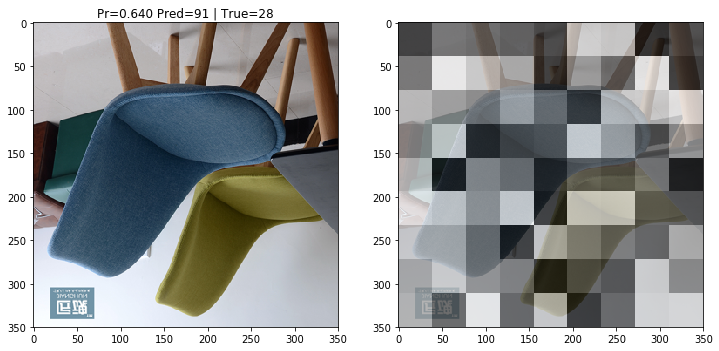

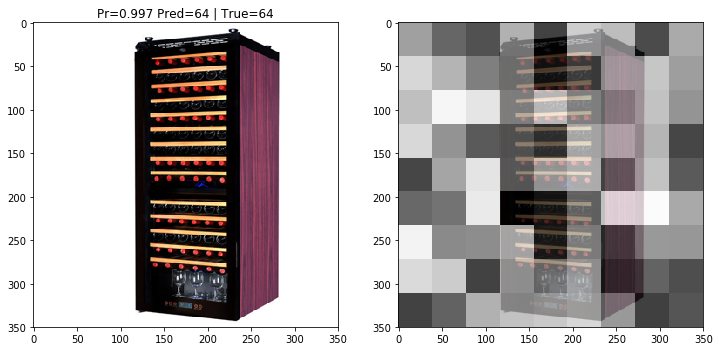

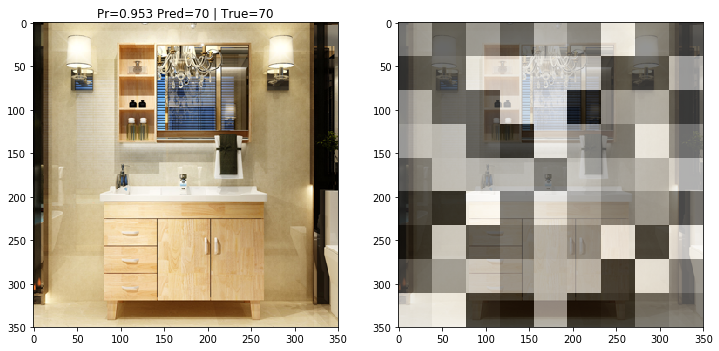

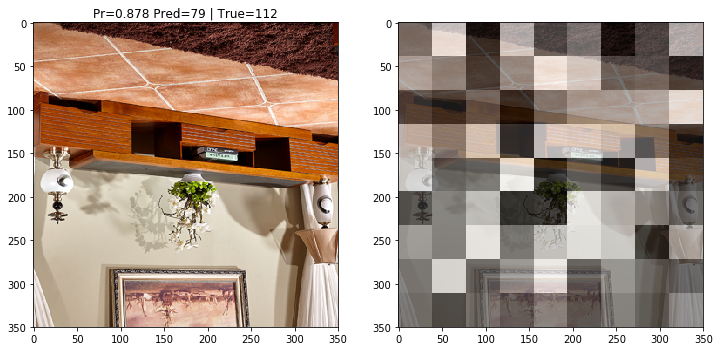

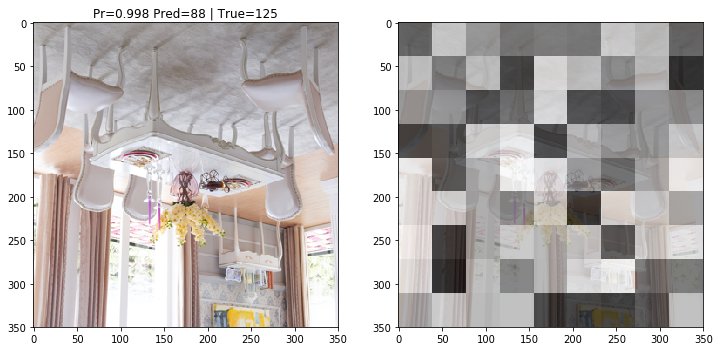

...

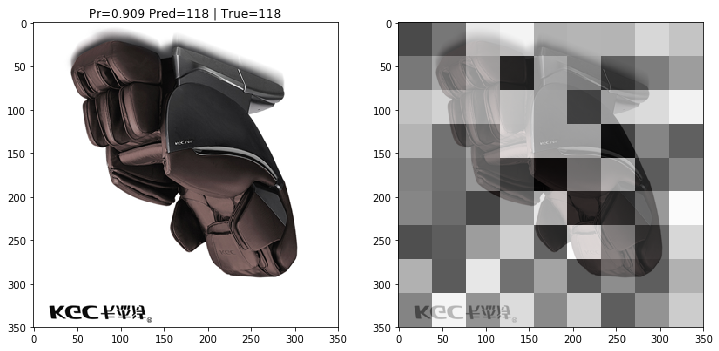

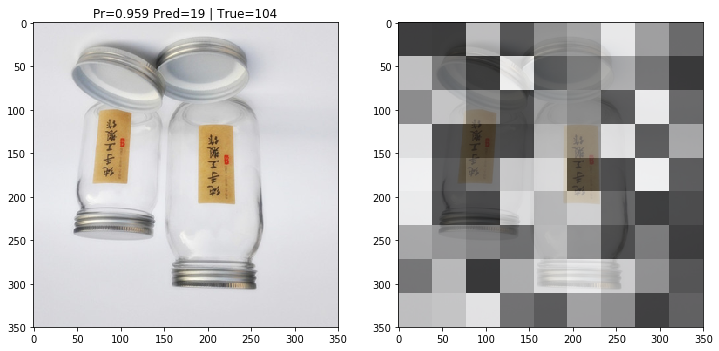

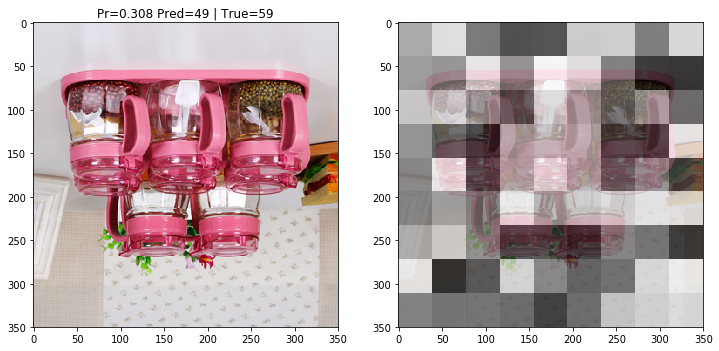

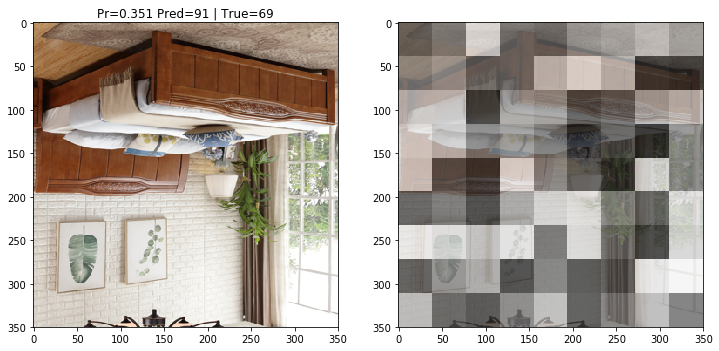

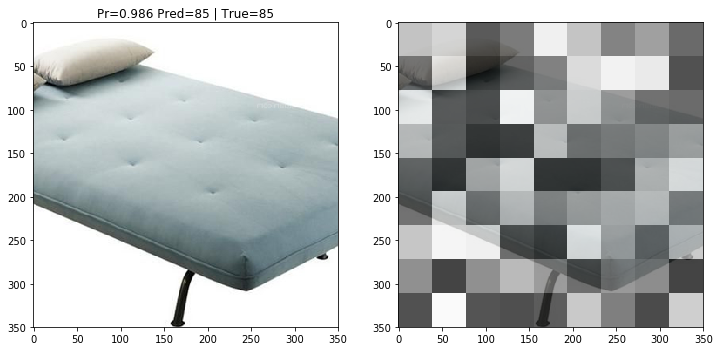

In [41]:
for index in range(len(batch_x)):

    fm = model(batch_x[index:index + 1, :, :, :])
    y_pred = model(batch_x[index:index + 1, :, :, :])
    y_probas = softmax(y_pred)
    label = get_label(batch_y[index].item())
    proba, pred = torch.topk(y_probas, k=1, dim=1)
    proba, pred = proba.item(), pred.item()

    fm = fm_hook.result

    fm, _ = fm.max(dim=1)
    img = transform(batch_x[index, :, :, :])

    fm_img = F.to_pil_image(fm, mode='L')
    fm_img = fm_img.resize(img.size).convert('RGB')

    activations = Image.blend(img, fm_img, alpha=0.75)
    plt.figure(figsize=(12, 12))
    plt.subplot(121)
    plt.title("Pr={:.3f} Pred={} | True={}".format(proba, pred, label))
    plt.imshow(img)
    plt.subplot(122)
    plt.imshow(activations)


/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:5: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  """


tensor(6302)
tensor(3349)
tensor(484)
tensor(2677)
tensor(1517)
tensor(5908)
tensor(1063)
tensor(3010)
tensor(4713)
tensor(2454)
tensor(6195)
tensor(6003)
tensor(2276)
tensor(5342)
tensor(274)
tensor(761)
tensor(916)
tensor(5115)
tensor(4758)
tensor(241)
tensor(5141)


/usr/local/lib/python3.5/dist-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


tensor(4041)
tensor(4043)
tensor(415)


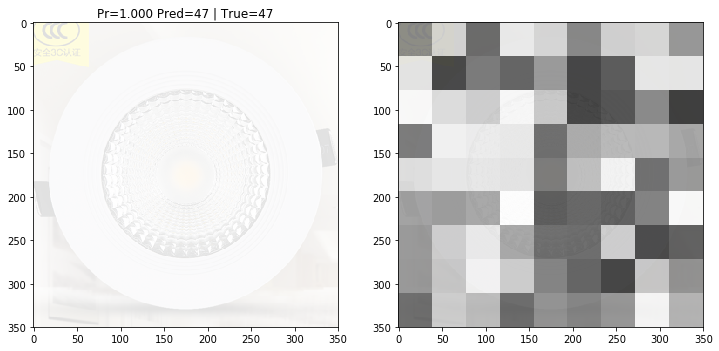

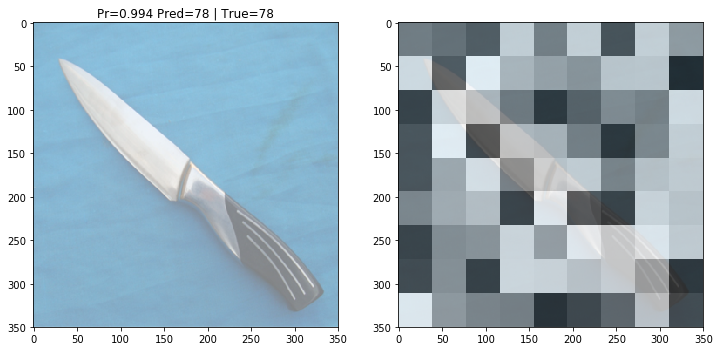

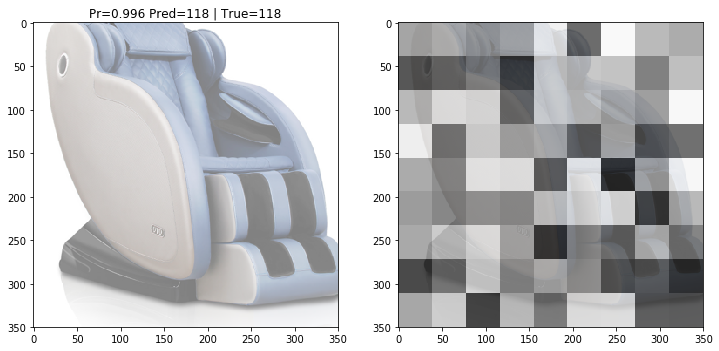

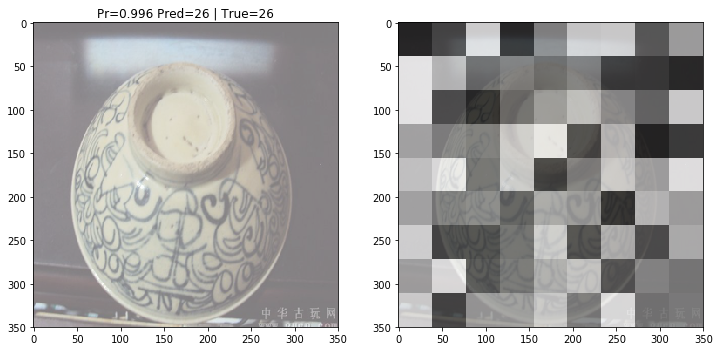

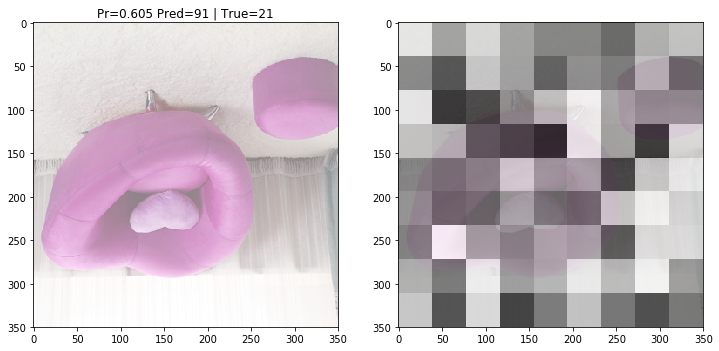

...

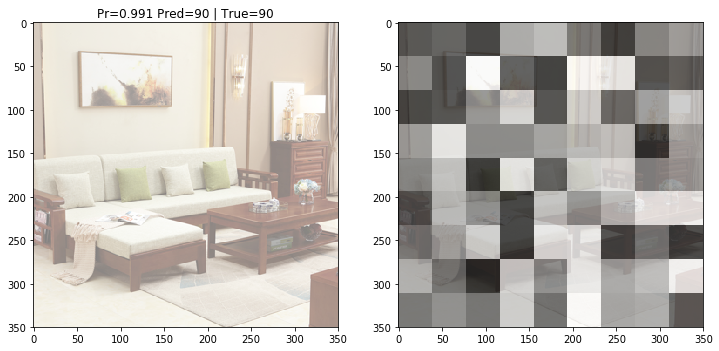

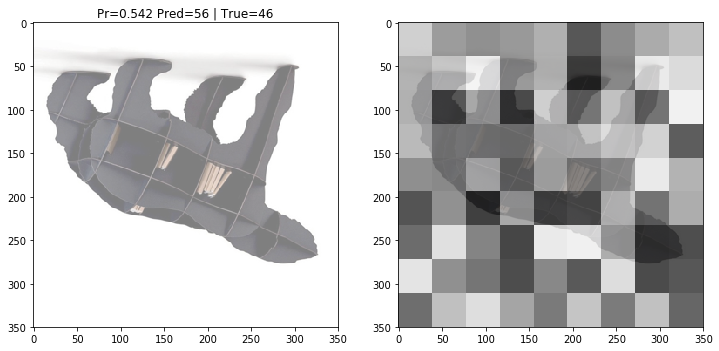

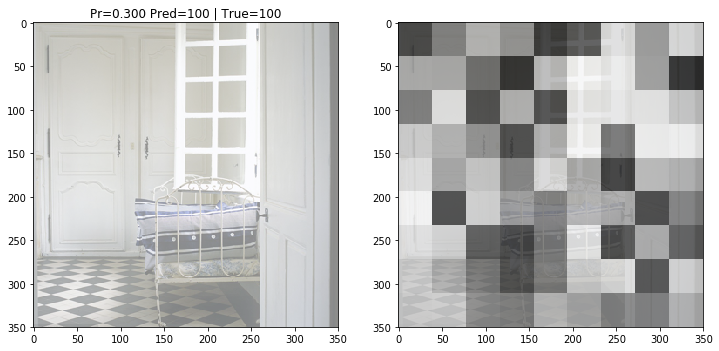

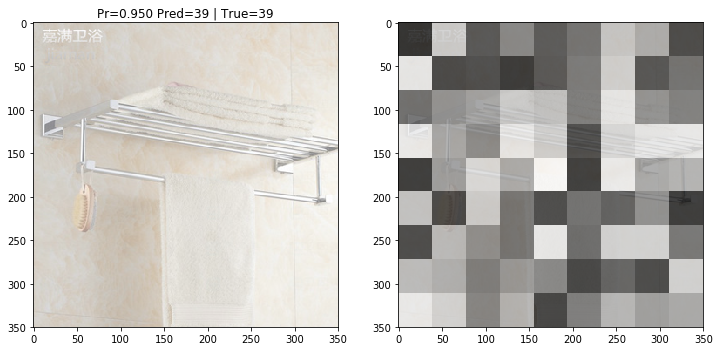

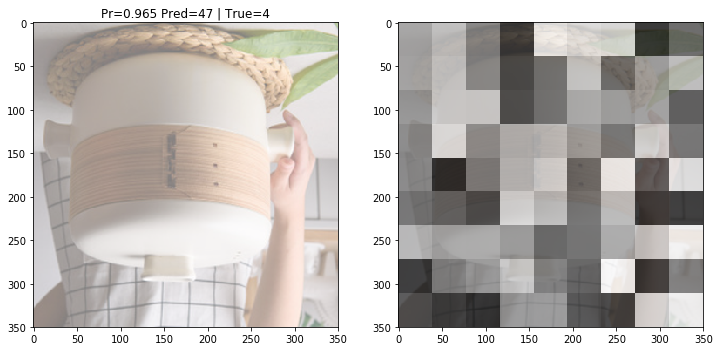

In [36]:
for index in range(len(batch_x)):

    fm = model(batch_x[index:index + 1, :, :, :])
    y_pred = model(batch_x[index:index + 1, :, :, :])
    y_probas = softmax(y_pred)
    label = get_label(batch_y[index].item())
    proba, pred = torch.topk(y_probas, k=1, dim=1)
    proba, pred = proba.item(), pred.item()

    fm = fm_hook.result

    fm, _ = fm.max(dim=1)
    img = transform(batch_x[index, :, :, :])

    fm_img = F.to_pil_image(fm, mode='L')
    fm_img = fm_img.resize(img.size).convert('RGB')

    activations = Image.blend(img, fm_img, alpha=0.75)
    plt.figure(figsize=(12, 12))
    plt.subplot(121)
    plt.title("Pr={:.3f} Pred={} | True={}".format(proba, pred, label))
    plt.imshow(img)
    plt.subplot(122)
    plt.imshow(activations)
